In [14]:
import numpy as np
import pandas as pd
# Ploting
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (8,6)
%config InlineBackend.figure_formats = ['svg']

In [56]:
import numpy as np
from scipy.ndimage import convolve
from scipy.ndimage import laplace

# Define the function u(x, t)
def u(x, t):
    return np.exp(x) * np.sin(np.pi * x) * np.cos(np.pi * t)

# Define function to calculate Laplacian using finite differences
# def laplacian_2d(u, dx, axis):
#     u_xx = np.diff(u, n=2, axis=axis) / dx**2
#     return u_xx

def laplacien(u):
  return laplace(u)
# Parameters
n_points = 1000
n1 = 0.5
n2 = 0.5

x = np.linspace(0, 10, n_points)
t = np.linspace(0, 10, n_points)
x.sort()

# Calculate derivatives for du/dt and du/dx
dt = 0.01
dx = x[1] - x[0]
du_dt_values = (u(x, t + dt) - u(x, t)) / dt
du_dx_values = np.gradient(u(x, t), dx)
u_values = u(x,t)
laplace_values = laplacien(u_values)
# Calculate du/dn using du/dx and du/dt
du_dn_values = du_dx_values * n1 + du_dt_values * n2
gamma_values = -du_dn_values / u_values
alpha_values = -u_values / du_dn_values
# alpha_values = -u_values / (du_dn_values +1e-10)

<ipython-input-56-5c26a7dbdec9>:34: RuntimeWarning: divide by zero encountered in divide
  gamma_values = -du_dn_values / u_values


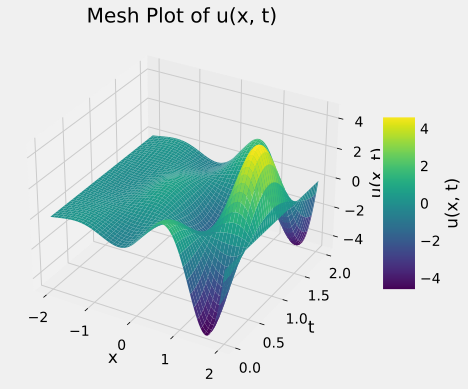

In [43]:
def u_function(x, t):
    return np.exp(x) * np.sin(np.pi * x) * np.cos(np.pi * t)
x = np.linspace(-2, 2, 100)
t = np.linspace(0, 2, 100)
x, t = np.meshgrid(x, t)
u_f = u_function(x, t)

# Create mesh plot with enhanced styling
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# Mesh plot with colormap and shading
mesh = ax.plot_surface(x, t, u_f, cmap='viridis', edgecolor='none', linewidth=0, antialiased=False)

ax.set_xlabel('x')
ax.set_ylabel('t')
ax.set_zlabel('u(x, t)')
ax.set_title('Mesh Plot of u(x, t)')

# Customize colorbar
cbar = fig.colorbar(mesh, shrink=0.5, aspect=5)
cbar.set_label('u(x, t)')

plt.show()

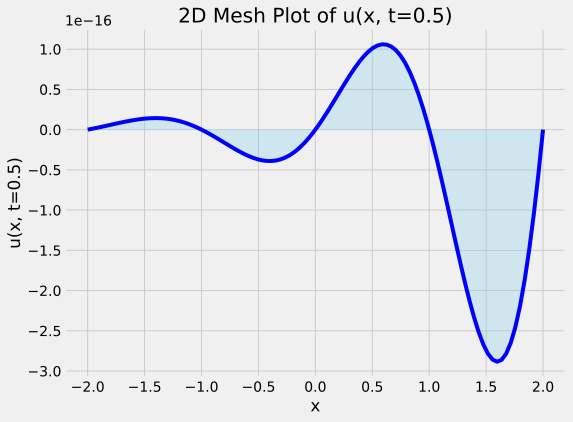

In [44]:
# Fixed value of t for the 2D mesh plot
t_val = 0.5

# Create a grid of x values for the 2D mesh plot
x_values = np.linspace(-2, 2, 100)

# Evaluate u(x, t) for the specified t value
u_values = u_function(x_values, t_val)

# Create 2D mesh plot
plt.figure(figsize=(8, 6))
plt.plot(x_values, u_values, color='blue')
plt.fill_between(x_values, u_values, color='skyblue', alpha=0.3)  # Fill area under the curve

plt.xlabel('x')
plt.ylabel('u(x, t=0.5)')
plt.title('2D Mesh Plot of u(x, t=0.5)')

plt.grid(True)
plt.show()

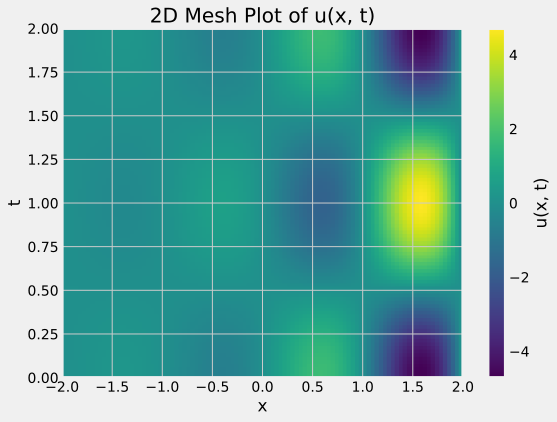

In [45]:
x = np.linspace(-2, 2, 100)
t = np.linspace(0, 2, 100)

# Create mesh grid
x, t = np.meshgrid(x, t)
u_f = u_function(x, t)

# Plot the 2D mesh with different colors for different time slices
plt.figure(figsize=(8, 6))
plt.imshow(u_f, extent=[min(x[0]), max(x[0]), min(t[:, 0]), max(t[:, 0])], aspect='auto', cmap='viridis')
plt.colorbar(label='u(x, t)')

plt.xlabel('x')
plt.ylabel('t')
plt.title('2D Mesh Plot of u(x, t)')

plt.show()

In [46]:
import sympy as sp

x, t = sp.symbols('x t')
u = sp.exp(x) * sp.sin(sp.pi * x) * sp.cos(sp.pi * t)

gradient_u = [sp.diff(u, x), sp.diff(u, t)]

n1, n2 = sp.symbols('n1 n2')
n = sp.Matrix([n1, n2])

du_dn = sp.Matrix(gradient_u).dot(n)

print("du/dn =", du_dn)

du/dn = n1*(exp(x)*sin(pi*x)*cos(pi*t) + pi*exp(x)*cos(pi*t)*cos(pi*x)) - pi*n2*exp(x)*sin(pi*t)*sin(pi*x)


<ipython-input-51-a04e9f88f9f0>:30: RuntimeWarning: divide by zero encountered in divide
  gamma_values = - Du_dn_values / U_values


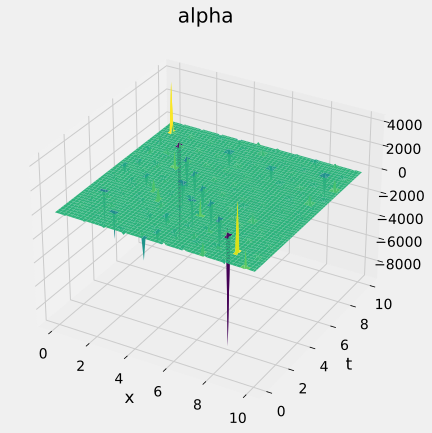

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import laplace

# Define the function u(x, t)
def u(x, t):
    return np.exp(x) * np.sin(np.pi * x) * np.cos(np.pi * t)

# Define function to calculate Laplacian using finite differences
def laplacien(u):
    return laplace(u)

# Parameters and grid creation
n_points = 100
n1 = 0.5
n2 = 0.5
x = np.linspace(0, 10, n_points)
t = np.linspace(0, 10, n_points)
X, T = np.meshgrid(x, t)

# Calculate function values on the 2D grid
U_values = u(X, T)
Laplace_values = laplacien(U_values)
Du_dx_values = np.gradient(U_values, axis=0)
Du_dt_values = np.gradient(U_values, axis=1)
Du_dn_values = Du_dx_values * n1 + Du_dt_values * n2

# Calculate gamma and alpha values
gamma_values = - Du_dn_values / U_values
alpha_values = -U_values /Du_dn_values

# Plotting functions on 3D surfaces with meshgrid
fig = plt.figure(figsize=(12, 18))

# ... (previous code for plotting other functions remains the same)

# Plot alpha
ax6 = fig.add_subplot(326, projection='3d')
ax6.plot_surface(X, T, alpha_values, cmap='viridis')
ax6.set_title('alpha')
ax6.set_xlabel('x')
ax6.set_ylabel('t')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/mpl_toolkits/mplot3d/proj3d.py:180: RuntimeWarning: invalid value encountered in divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


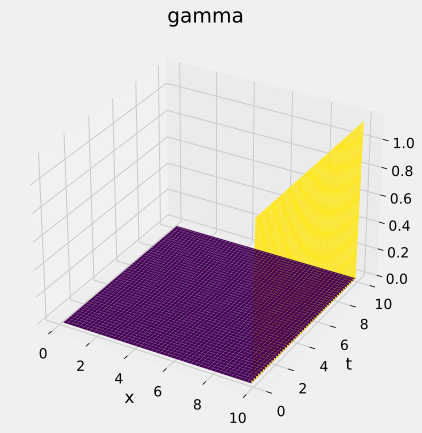

In [52]:


# Plotting functions on 3D surfaces with meshgrid
fig = plt.figure(figsize=(12, 18))

# ... (code for plotting other functions remains the same as previous)

# Plot gamma
ax6 = fig.add_subplot(326, projection='3d')
ax6.plot_surface(X, T, gamma_values, cmap='viridis')
ax6.set_title('gamma')
ax6.set_xlabel('x')
ax6.set_ylabel('t')

plt.tight_layout()
plt.show()


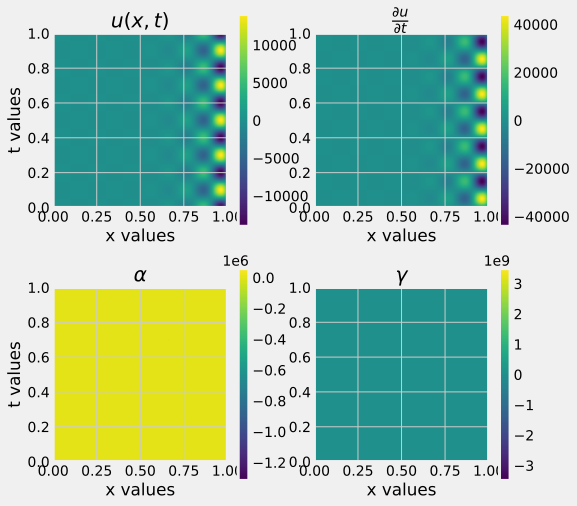

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

dt = 0.01
dx = 0.01
# Your computed values for different functions (replace with your actual data)
# Example values from your provided code
x = np.linspace(0, 10, 1000)
t = np.linspace(0, 10, 1000)
X, T = np.meshgrid(x, t)

# Replace these placeholders with your actual computed values
u_values = np.exp(X) * np.sin(np.pi * X) * np.cos(np.pi * T)
laplace_values = laplacien(u_values)  # Replace with your computed laplace values
du_dx_values =(u(X + dx, T) - u(X, T)) / dx   # Replace with your computed du/dx values
du_dt_values = (u(X, T + dt) - u(X, T)) / dt  # Replace with your computed du/dt values
du_dn_values = du_dx_values * n1 + du_dt_values * n2  # Replace with your computed du/dn values
gamma_values = -du_dn_values /(u_values + 1e-5)  # Replace with your computed gamma values
alpha_values = -u_values / du_dn_values  # Replace with your computed alpha values

plt.figure(figsize=(16, 8))

plt.subplot2grid((2, 4), (0, 0))
plt.imshow(u_values, extent=[0, 1, 0, 1], origin='lower', cmap='viridis')
plt.colorbar()
plt.title('$u(x, t)$')
plt.xlabel('x values')
plt.ylabel('t values')

plt.subplot2grid((2, 4), (0, 1))
plt.imshow(du_dt_values, extent=[0, 1, 0, 1], origin='lower', cmap='viridis')
plt.colorbar()
plt.title('$\\frac{\\partial u}{\\partial t}$')
plt.xlabel('x values')

plt.subplot2grid((2, 4), (1, 0))
plt.imshow(alpha_values, extent=[0, 1, 0, 1], origin='lower', cmap='viridis')
plt.colorbar()
plt.title('$\\alpha$')
plt.xlabel('x values')
plt.ylabel('t values')

plt.subplot2grid((2, 4), (1, 1))
plt.imshow(gamma_values, extent=[0, 1, 0, 1], origin='lower', cmap='viridis')
plt.colorbar()
plt.title('$\\gamma$')
plt.xlabel('x values')

plt.show()

In [15]:
import numpy as np
from scipy.ndimage import convolve
from scipy.ndimage import laplace

# Define the function u(x, t)
def u(x, t):
    return np.exp(x) * np.sin(np.pi * x) * np.cos(np.pi * t)

# Define function to calculate Laplacian using finite differences
# def laplacian_2d(u, dx, axis):
#     u_xx = np.diff(u, n=2, axis=axis) / dx**2
#     return u_xx

def laplacien(u):
  return laplace(u)
# Parameters
n_points = 1000
n1 = 0.5
n2 = 0.5

x = np.linspace(0, 10, n_points)
t = np.linspace(0, 10, n_points)
x.sort()

# Calculate derivatives for du/dt and du/dx
dt = 0.01
dx = x[1] - x[0]
du_dt_values = (u(x, t + dt) - u(x, t)) / dt
du_dx_values = np.gradient(u(x, t), dx)
u_values = u(x,t)
laplace_values = laplacien(u_values)
# Calculate du/dn using du/dx and du/dt
du_dn_values = du_dx_values * n1 + du_dt_values * n2
gamma_values = -du_dn_values / u_values
alpha_values = -u_values / du_dn_values
# alpha_values = -u_values / (du_dn_values +1e-10)

<ipython-input-15-5c26a7dbdec9>:34: RuntimeWarning: divide by zero encountered in divide
  gamma_values = -du_dn_values / u_values


In [16]:
df = pd.DataFrame({'x': x , 't': t , 'u':u_values , 'u_t':du_dt_values , 'u_x':du_dx_values , 'alpha': alpha_values , 'gamma': gamma_values})
csv_file_path = 'equation_values.csv'
df.to_csv(csv_file_path , index=False)
df = pd.read_csv(csv_file_path)
df

,x,t,u,u_t,u_x,alpha,gamma
0,0.00000,0.00000,0.000000e+00,0.000000e+00,3.171106,-0.000000e+00,-inf
1,0.01001,0.01001,3.174281e-02,-4.702859e-03,3.196675,-1.988915e-02,-5.027868e+01
2,0.02002,0.02002,6.399751e-02,-1.581775e-02,3.241733,-3.967712e-02,-2.520344e+01
3,0.03003,0.03003,9.664236e-02,-3.349257e-02,3.274424,-5.963862e-02,-1.676766e+01
4,0.04004,0.04004,1.295515e-01,-5.785196e-02,3.294367,-8.005619e-02,-1.249123e+01
...,...,...,...,...,...,...,...
995,9.95996,9.95996,-2.633960e+03,-9.162693e+02,61721.384139,8.663612e-02,1.154253e+01
996,9.96997,9.96997,-2.004604e+03,-4.968894e+02,63918.396928,6.321527e-02,1.581896e+01
997,9.97998,9.97998,-1.354312e+03,-2.010803e+02,65898.063393,4.122904e-02,2.425475e+01
998,9.98999,9.98999,-6.853234e+02,-3.390103e+01,67647.880809,2.027165e-02,4.932998e+01


In [92]:
df['new_x'] = df['x'].apply(lambda x : round(x , 0) if not np.isinf(x) and not np.isnan(x) else x)
df[~df['alpha'].isin([np.inf , -np.inf])]
df[~df['gamma'].isin([np.inf , -np.inf])]
df.to_csv('new_values.csv', index=False)
t_df = pd.read_csv('new_values.csv' , usecols=['new_x','u','u_t','u_x','alpha', 'gamma'])
t_df.groupby('new_x').u.agg(['count' , 'mean']).sort_values('count' , ascending=False)

,count,mean
new_x,,
1.0,100,0.219654
2.0,100,0.597141
3.0,100,1.623291
4.0,100,4.412639
5.0,100,11.994517
6.0,100,32.602394
7.0,100,88.613222
8.0,100,240.840676
9.0,100,654.550831


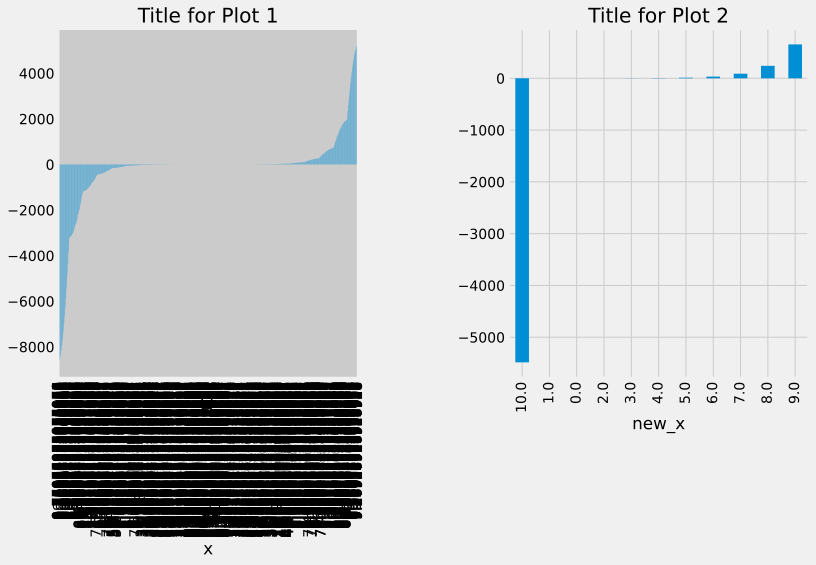

In [94]:
data2 = t_df.groupby('new_x').u.mean().sort_values()
data1 = df.groupby('x').u.mean().sort_values()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
data1.plot.bar(ax=ax1)
ax1.set_title("Title for Plot 1")
data2.plot.bar(ax=ax2)
ax2.set_title("Title for Plot 2")
plt.subplots_adjust(wspace=0.5)
plt.show()

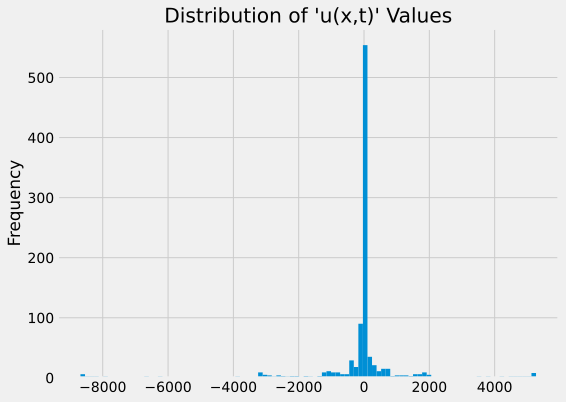

In [95]:
df.u.plot.hist(bins=100)
plt.title("Distribution of 'u(x,t)' Values")
plt.show()

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


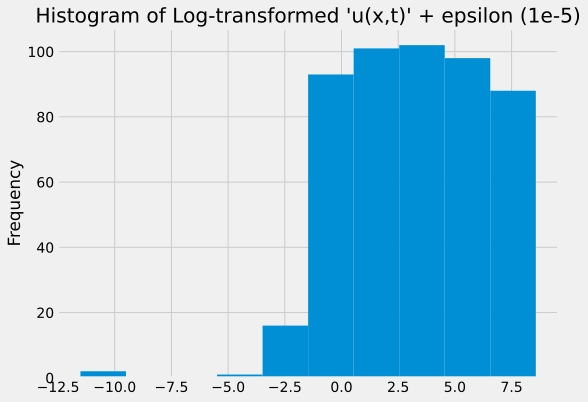

In [96]:
target = np.log(t_df['u'].abs())
epsilon = 1e-5
target = np.log(t_df['u'] + epsilon)
target.plot.hist()
plt.title("Histogram of Log-transformed 'u(x,t)' + epsilon (1e-5)")

plt.show()

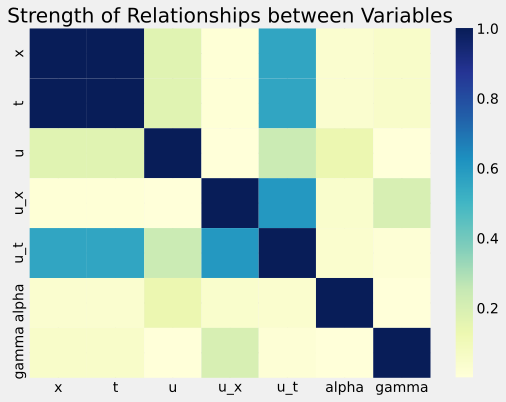

In [98]:
import seaborn as sns
heatmap = sns.heatmap(df[['x','t', 'u', 'u_x', 'u_t','alpha','gamma']].corr().abs(), cmap='YlGnBu')
heatmap.set_title("Strength of Relationships between Variables")
plt.show()

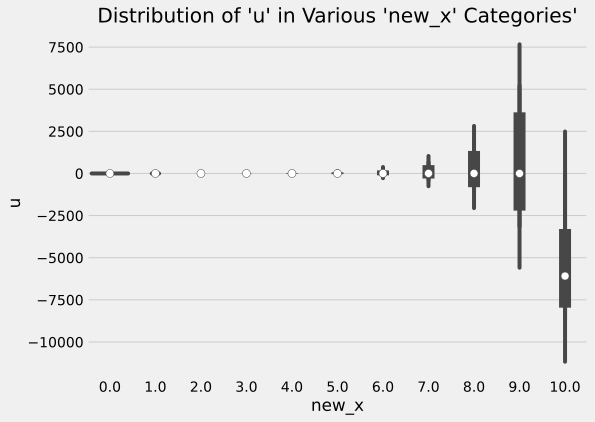

In [101]:
sns.violinplot(x='new_x' , y='u' , data=t_df)
plt.title("Distribution of 'u' in Various 'new_x' Categories'")
plt.show()

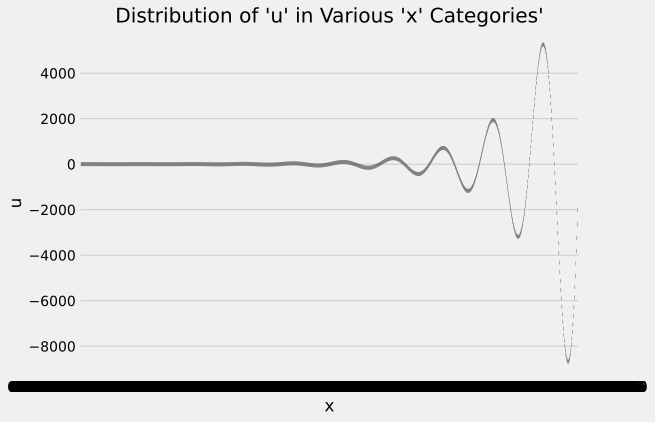

In [102]:
sns.violinplot(x='x' , y='u' , data=df)
plt.title("Distribution of 'u' in Various 'x' Categories'")
plt.show()

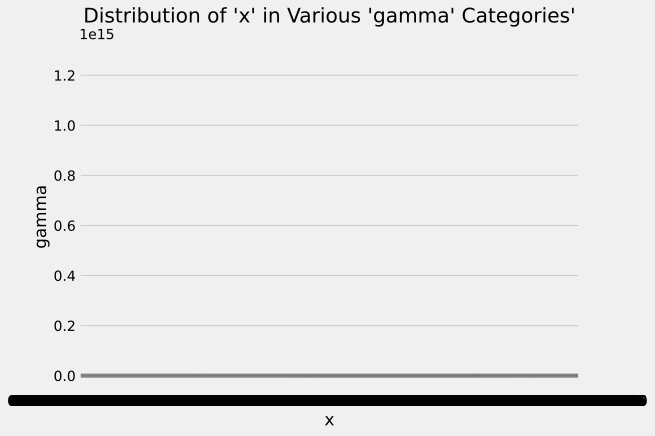

In [112]:
sns.violinplot(x='x' , y='gamma' , data=df)
plt.title("Distribution of 'x' in Various 'gamma' Categories'")
plt.show()

In [119]:
import numpy as np
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Generate data for training
x_values = np.linspace(0, 2, 100)
t_values = np.linspace(0, 2, 100)
x_mesh, t_mesh = np.meshgrid(x_values, t_values)
u_target_values = np.exp(x_mesh) * np.sin(np.pi * x_mesh) * np.cos(np.pi * t_mesh)

# Flatten the data for training
X_train = np.vstack((x_mesh.flatten(), t_mesh.flatten())).T
y_train = u_target_values.flatten()

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Create a neural network regressor
model = MLPRegressor(hidden_layer_sizes=(50, 50), max_iter=1000, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Reshape predictions to match the shape of u_target_values
predicted_values = model.predict(np.array([x_mesh.flatten(), t_mesh.flatten()]).T).reshape(u_target_values.shape)

# Calculate residuals
residuals = u_target_values - predicted_values

# Visualize the model performance with a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(residuals, cmap='coolwarm', annot=True, fmt=".2f", cbar_kws={'label': 'Residuals'})
plt.title('Model Residuals')
plt.xlabel('x')
plt.ylabel('t')
plt.show()

Mean Squared Error: 0.005865433908957086


Epoch 1/2000
313/313 [==============================] - 1s 2ms/step - loss: 2.8874
Epoch 2/2000
313/313 [==============================] - 1s 3ms/step - loss: 2.2569
Epoch 3/2000
313/313 [==============================] - 1s 4ms/step - loss: 1.5043
Epoch 4/2000
313/313 [==============================] - 1s 4ms/step - loss: 1.3065
Epoch 5/2000
313/313 [==============================] - 2s 5ms/step - loss: 1.2297
Epoch 6/2000
313/313 [==============================] - 2s 6ms/step - loss: 1.1574
Epoch 7/2000
313/313 [==============================] - 2s 6ms/step - loss: 1.0419
Epoch 8/2000
313/313 [==============================] - 1s 5ms/step - loss: 0.8896
Epoch 9/2000
313/313 [==============================] - 1s 4ms/step - loss: 0.7352
Epoch 10/2000
313/313 [==============================] - 1s 3ms/step - loss: 0.6473
Epoch 11/2000
313/313 [==============================] - 1s 5ms/step - loss: 0.5524
Epoch 12/2000
313/313 [==============================] - 1s 4ms/step - loss: 0.4611
E

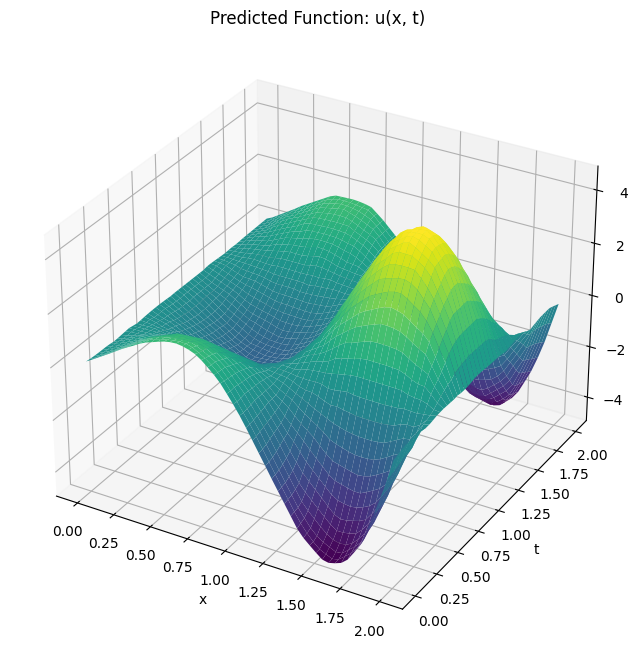

In [4]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Generate data for training
x_values = np.linspace(0, 2, 100)
t_values = np.linspace(0, 2, 100)
x_mesh, t_mesh = np.meshgrid(x_values, t_values)
u_target_values = np.exp(x_mesh) * np.sin(np.pi * x_mesh) * np.cos(np.pi * t_mesh)

# Reshape input data for the neural network
X_train = np.vstack((x_mesh.flatten(), t_mesh.flatten())).T
y_train = u_target_values.flatten()

# Create a neural network model
model = Sequential([
    Dense(64, input_shape=(2,), activation='relu'),
    Dense(32, activation='relu'),
    Dense(1)  # Output layer, predicting a single value
])

# Compile the model
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01)
model.compile(optimizer=optimizer, loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=2000, batch_size=32, verbose=1)

# Generate test data for prediction
x_test, t_test = np.meshgrid(np.linspace(0, 2, 50), np.linspace(0, 2, 50))
X_test = np.vstack((x_test.flatten(), t_test.flatten())).T

# Predict using the trained model
predicted_values = model.predict(X_test)
predicted_values = predicted_values.reshape(x_test.shape)  # Reshape to match the meshgrid shape

# Plot the predicted function in 3D
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x_test, t_test, predicted_values, cmap='viridis')
ax.set_xlabel('x')
ax.set_ylabel('t')
ax.set_zlabel('u(x, t)')
ax.set_title('Predicted Function: u(x, t)')
plt.show()

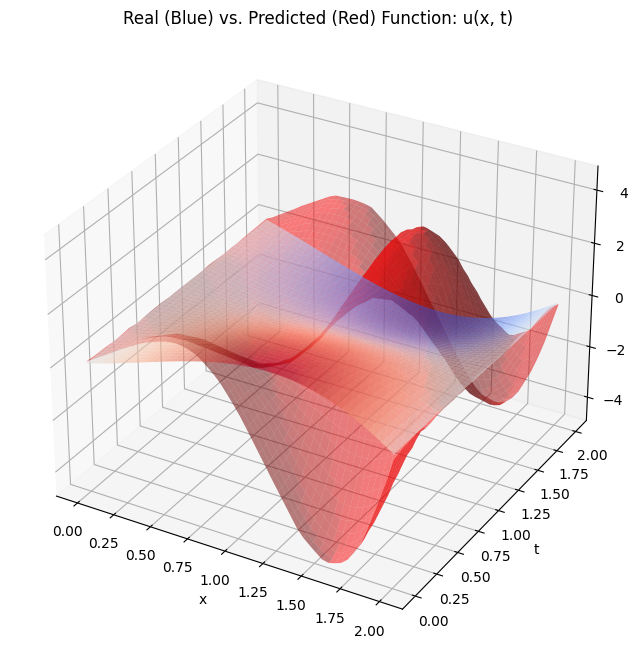

In [5]:

# Plot the real values (in blue) and predicted values (in red) in a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot real values (in blue)
ax.plot_surface(x_test, t_test, u_target_values[:50, :50], cmap='coolwarm', alpha=0.6)

# Plot predicted values (in red)
ax.plot_surface(x_test, t_test, predicted_values, color='red', alpha=0.5)

ax.set_xlabel('x')
ax.set_ylabel('t')
ax.set_zlabel('u(x, t)')
ax.set_title('Real (Blue) vs. Predicted (Red) Function: u(x, t)')
plt.show()

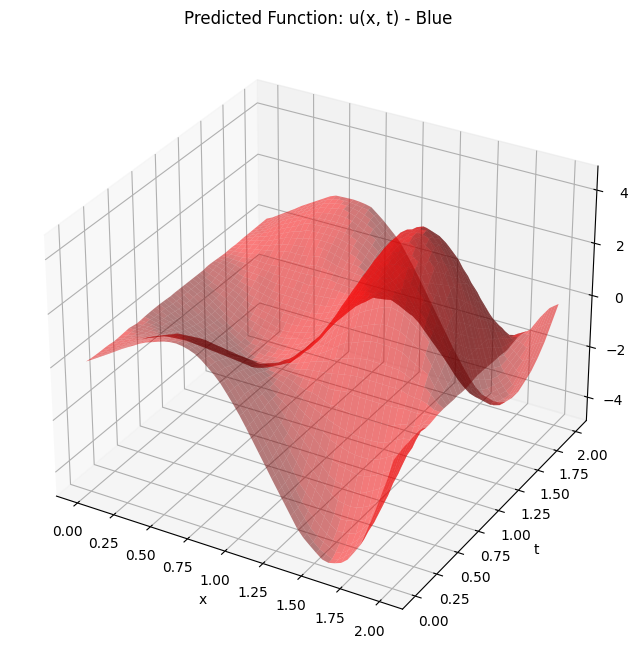

In [8]:
# Plot predicted values (in red)
fig = plt.figure(figsize=(10, 8))
ax_pred = fig.add_subplot(111, projection='3d')
ax_pred.plot_surface(x_test, t_test, predicted_values, color='red', alpha=0.5)
ax_pred.set_xlabel('x')
ax_pred.set_ylabel('t')
ax_pred.set_zlabel('u(x, t)')
ax_pred.set_title('Predicted Function: u(x, t) - Blue')

plt.show()